In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
#import jax
#jax.config.update('jax_platform_name', 'cpu')

In [3]:
from entot.data.data import create_gaussians, create_gaussian_split
from entot.plotting.plots import plot_1D
from entot.models.models import NoiseOutsourcingModel
from entot.models.utils import MixtureNormalSampler
import matplotlib.pyplot as plt
import numpy as np
import jax
import jax.numpy as jnp

In [4]:
sampler_source = MixtureNormalSampler([0], 1, 100, 0.5)
sampler_target = MixtureNormalSampler([-1.0,1.0], 1, 100, 0.1)

In [5]:
sm = NoiseOutsourcingModel(0.1, 512, 512, iterations=500, inner_iterations=20, input_dim=1, noise_dim=4, std=0.1, callback=plot_1D, callback_iters=5)

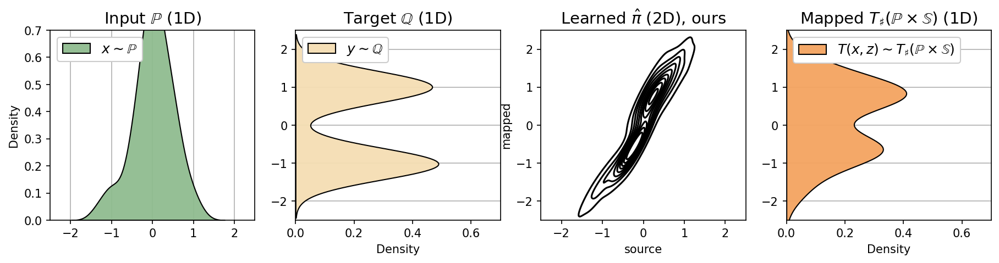

100%|██████████| 500/500 [30:04<00:00,  3.61s/it]


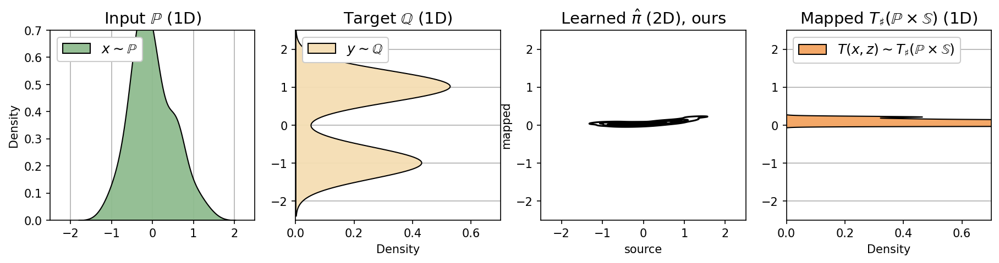

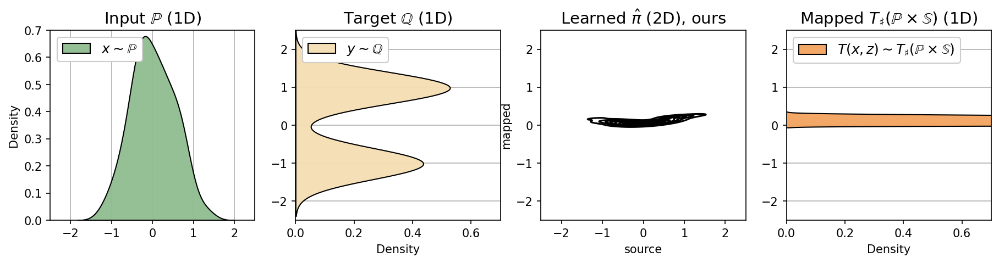

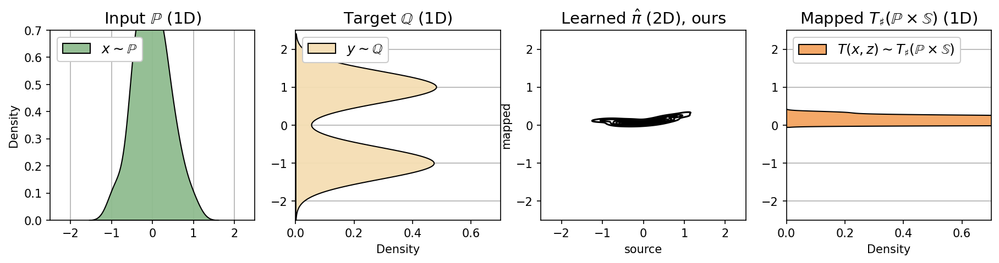

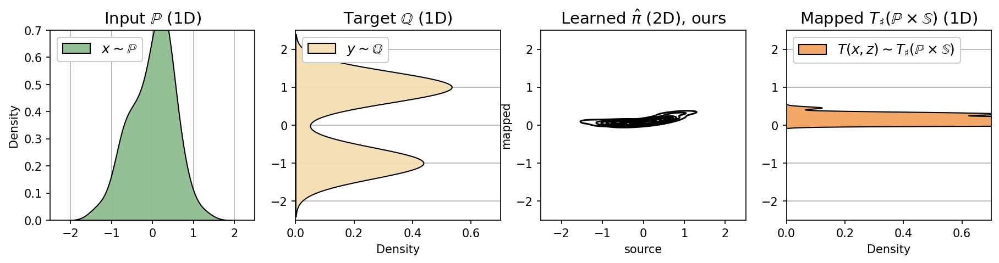

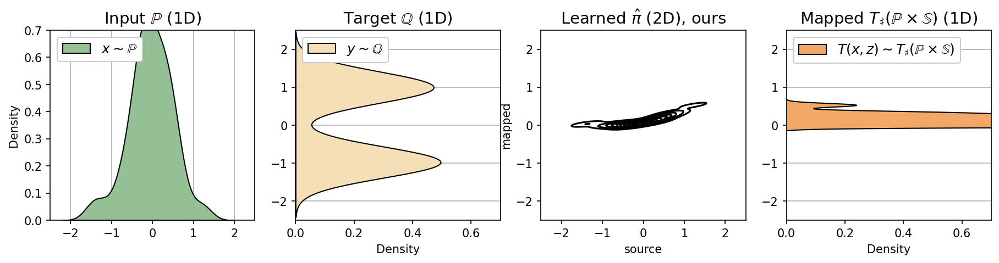

...

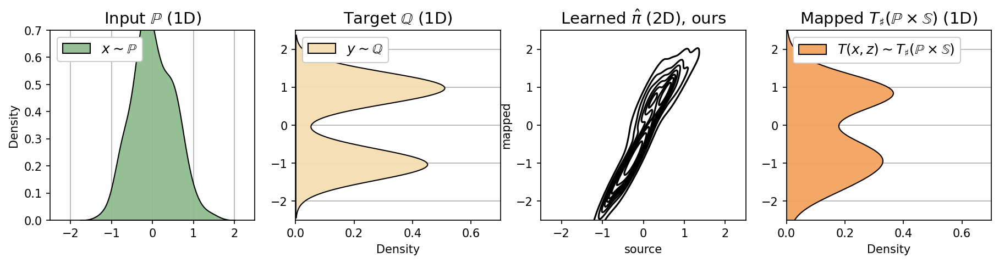

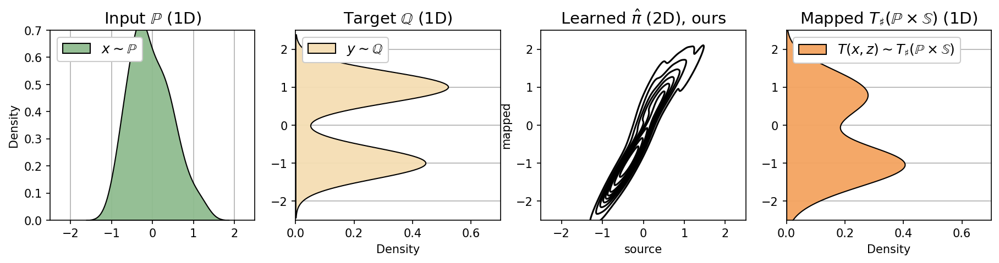

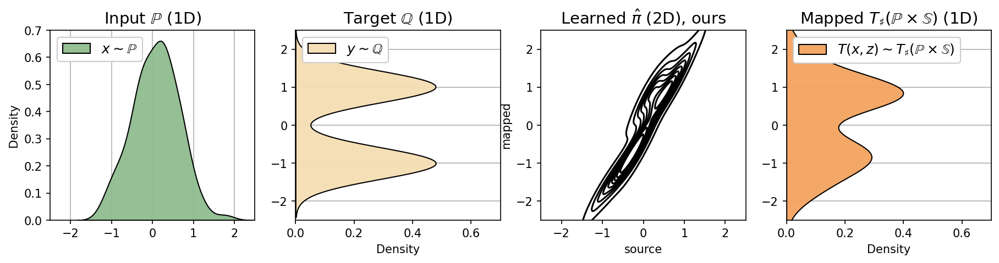

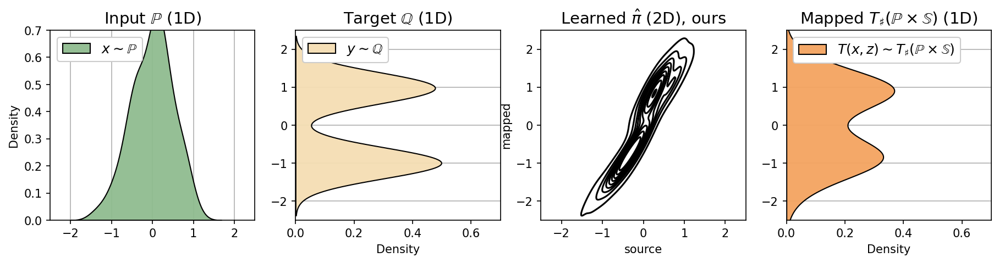

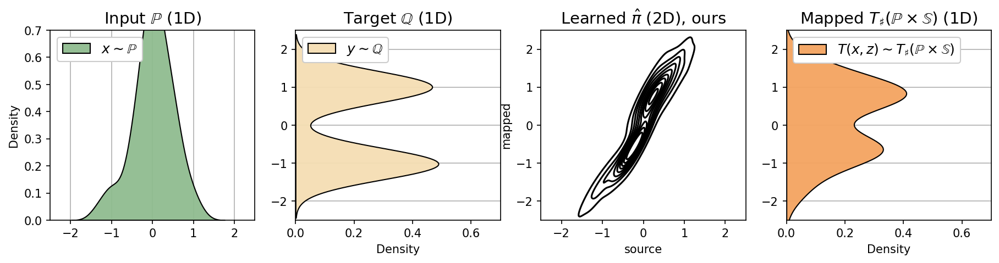

In [6]:
sm(sampler_source, sampler_target)

In [8]:
sm.sample(jnp.array([0]))

Array([[-0.05483729],
       [ 0.50867844],
       [-0.47168592],
       [ 1.1080925 ],
       [ 0.03892179],
       [ 0.24962454],
       [ 0.25863102],
       [ 0.72369844],
       [-0.04085078],
       [ 0.23618563]], dtype=float32)

Variance p(Y|X=0.5) is 0.18


<Axes: ylabel='Density'>

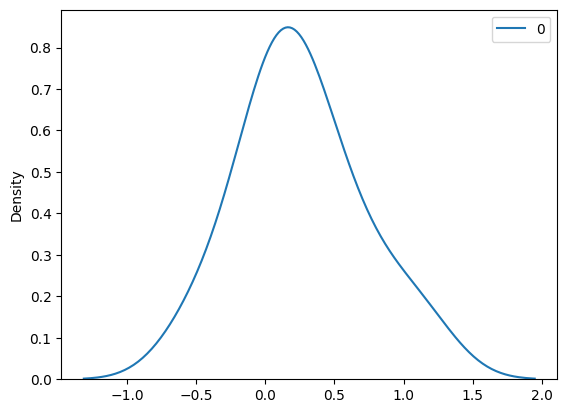

In [18]:
import seaborn as sns
sample_0 = sm.sample(jnp.array([0]))
print(f"Variance p(Y|X=0.5) is {jnp.var(sample_0):.2f}")
sns.kdeplot(sample_0)


Variance p(Y|X=0.5) is 0.10


<Axes: ylabel='Density'>

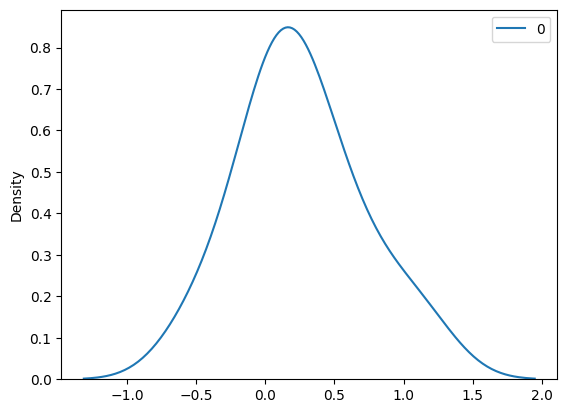

In [19]:
sample_05 = sm.sample(jnp.array([0.5]))
print(f"Variance p(Y|X=0.5) is {jnp.var(sample_05):.2f}")
sns.kdeplot(sample_0)